In [1]:
import numpy as np # linear algebra
import pandas as pd 

import os
for dirname, _, filenames in os.walk('input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

input\sample_submission.csv
input\test.csv
input\train.csv
input\test_images\0005cfc8afb6.png
input\test_images\003f0afdcd15.png
input\test_images\006efc72b638.png
input\test_images\00836aaacf06.png
input\test_images\009245722fa4.png
input\test_images\009c019a7309.png
input\test_images\010d915e229a.png
input\test_images\0111b949947e.png
input\test_images\01499815e469.png
input\test_images\0167076e7089.png
input\test_images\01c31b10ab99.png
input\test_images\01c5ba195207.png
input\test_images\01e4d86b3a30.png
input\test_images\020921b796d5.png
input\test_images\020f6983114d.png
input\test_images\021c207614d6.png
input\test_images\0229c0a80d42.png
input\test_images\024d0a225db1.png
input\test_images\0268f4382c67.png
input\test_images\0299d97f31f7.png
input\test_images\03042a663e54.png
input\test_images\030e06ddbb04.png
input\test_images\033cdbbbdfaa.png
input\test_images\03be80919be4.png
input\test_images\03eaa4eef484.png
input\test_images\0434995d0654.png
input\test_images\04a0773c71fb.

Initialze Parameters

In [2]:
import os, sys
import matplotlib.pyplot as plt
import cv2
from sklearn.model_selection import train_test_split
from PIL import Image
import warnings
warnings.filterwarnings("ignore")
IMG_SIZE = 512

In [3]:
df_train=pd.read_csv("input\\train.csv")
df_test=pd.read_csv("input\\test.csv")

In [4]:
df_train.head()

,id_code,diagnosis
0,000c1434d8d7,2
1,001639a390f0,4
2,0024cdab0c1e,1
3,002c21358ce6,0
4,005b95c28852,0


In [5]:
x = df_train["id_code"]
y = df_train["diagnosis"]

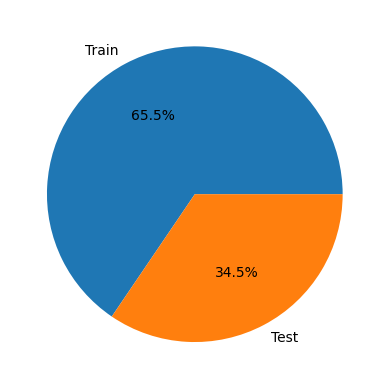

In [6]:
labels = ["Train","Test"]
sizes = [len(df_train),len(df_test)]

plt.pie(sizes,labels=labels,autopct='%1.1f%%')
plt.show()

In [7]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.15, random_state=42)
print("x_train shape: ", x_train.shape)
print("x_test shape: ", x_test.shape)
print("y_train shape: ",y_train.shape)
print("y_test shape: ", y_test.shape)

x_train shape:  (3112,)
x_test shape:  (550,)
y_train shape:  (3112,)
y_test shape:  (550,)


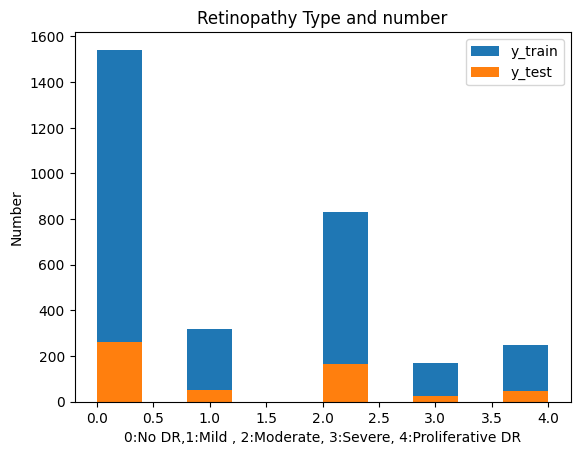

In [8]:
plt.hist(y_train,label="y_train")
plt.hist(y_test,label="y_test")
plt.title("Retinopathy Type and number")
plt.xlabel("0:No DR,1:Mild , 2:Moderate, 3:Severe, 4:Proliferative DR")
plt.ylabel("Number")
plt.legend()
plt.show()

CPU times: total: 562 ms
Wall time: 3.18 s


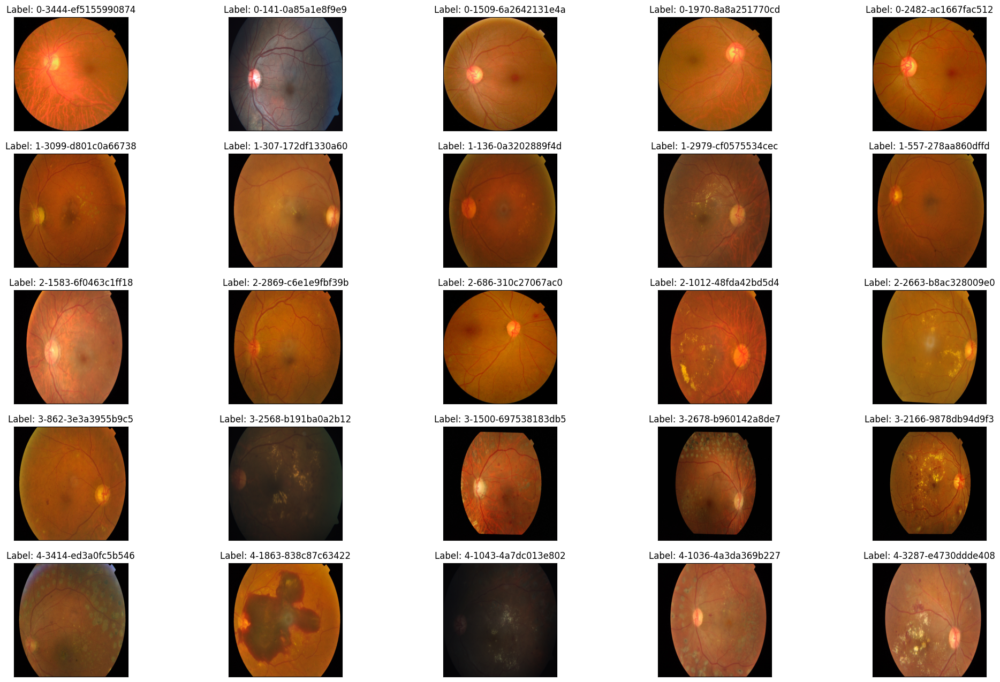

In [9]:
 %%time
fig = plt.figure(figsize=(25, 16))
# display 10 images from each class
for i in sorted(y_train.unique()):
    for j, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == i].sample(5, random_state=42).iterrows()):
        ax = fig.add_subplot(5, 5, i * 5 + j + 1, xticks=[], yticks=[])
        path=f"input\\train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        plt.imshow(image)
        ax.set_title('Label: %d-%d-%s' % (i, idx, row['id_code']) )

CPU times: total: 344 ms
Wall time: 2.92 s


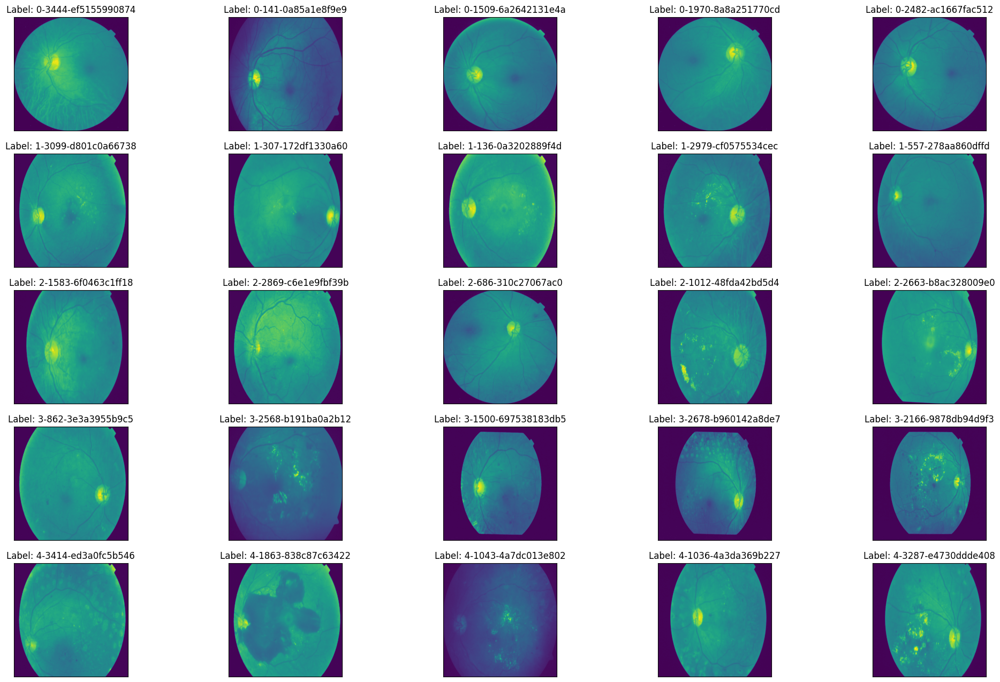

In [10]:
%%time
fig=plt.figure(figsize=(25,16))
for i in sorted(y_train.unique()):
    for j ,(idx,row) in enumerate(df_train.loc[df_train["diagnosis"]==i].sample(5,random_state=42).iterrows()):
        ax = fig.add_subplot(5, 5, i*5+j+1, xticks=[], yticks=[])
        path=f"input\\train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))

        plt.imshow(image)
        ax.set_title('Label: %d-%d-%s' % (i, idx, row['id_code']) )

CPU times: total: 516 ms
Wall time: 2.93 s


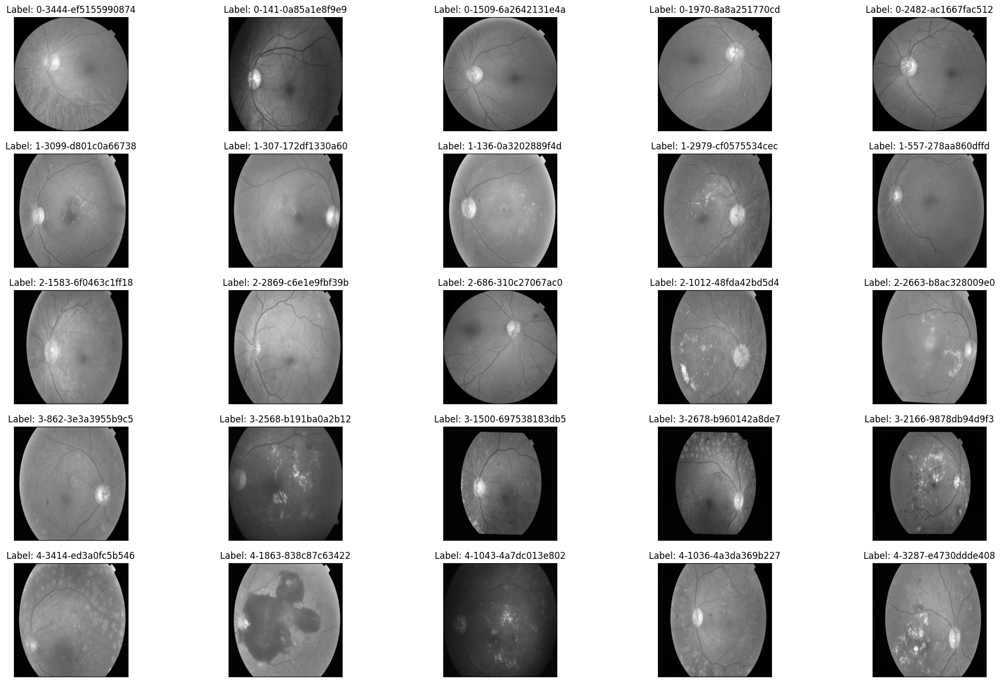

In [11]:
%%time
fig=plt.figure(figsize=(25,16))
for i in sorted(y_train.unique()):
    for j ,(idx,row) in enumerate(df_train.loc[df_train["diagnosis"]==i].sample(5,random_state=42).iterrows()):
        ax = fig.add_subplot(5, 5, i*5+j+1, xticks=[], yticks=[])
        path=f"input\\train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))

        plt.imshow(image,cmap="gray")
        ax.set_title('Label: %d-%d-%s' % (i, idx, row['id_code']) )

Testing and Checking

1736 2416


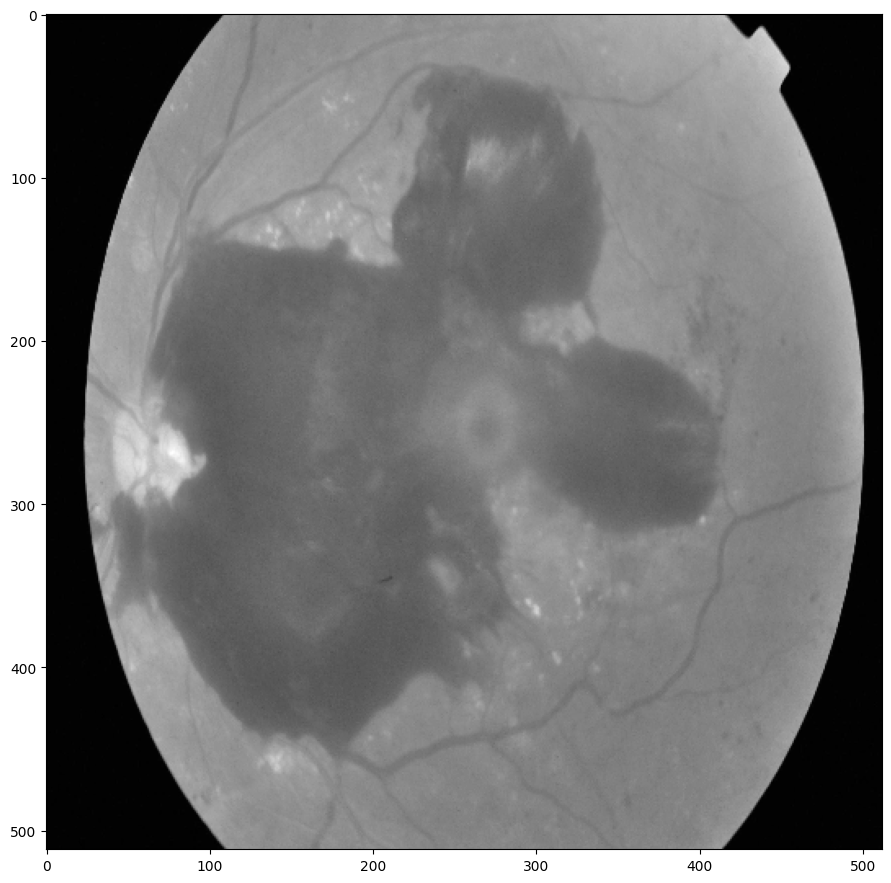

In [12]:
dpi=80

path=f"input\\train_images\\838c87c63422.png"
image = cv2.imread(path)
image=cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
height,width=image.shape
print(height,width)
SCALE=2
figsize=(width/float(dpi))/SCALE,(height/float(dpi))/SCALE
image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
fig=plt.figure(figsize=figsize)
plt.imshow(image,cmap="gray")

Ben Graham Lighting Method 

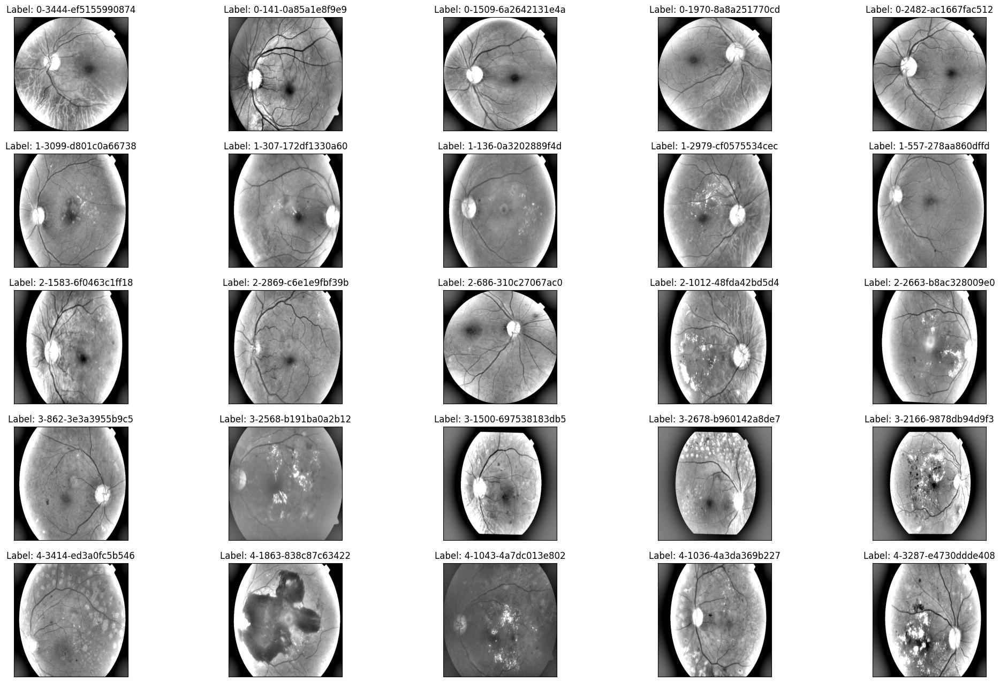

In [13]:
fig=plt.figure(figsize=(25,16))
for i in sorted(y_train.unique()):
    for j,(idx,row) in enumerate(df_train.loc[df_train["diagnosis"]==i].sample(5,random_state=42).iterrows()):
        
        ax = fig.add_subplot(5, 5, i*5+j+1, xticks=[], yticks=[])
        path=f"input\\train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , IMG_SIZE/10) ,-4 ,128) 

        plt.imshow(image, cmap='gray')
        ax.set_title('Label: %d-%d-%s' % (i, idx, row['id_code']) )

In [14]:
def crop_image_from_gray(img,tol=7):
    if img.ndim ==2:
        mask = img>tol
        return img[np.ix_(mask.any(1),mask.any(0))]
    elif img.ndim==3:
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        mask = gray_img>tol
        
        check_shape = img[:,:,0][np.ix_(mask.any(1),mask.any(0))].shape[0]
        if (check_shape == 0): # image is too dark so that we crop out everything,
            return img # return original image
        else:
            img1=img[:,:,0][np.ix_(mask.any(1),mask.any(0))]
            img2=img[:,:,1][np.ix_(mask.any(1),mask.any(0))]
            img3=img[:,:,2][np.ix_(mask.any(1),mask.any(0))]
    #         print(img1.shape,img2.shape,img3.shape)
            img = np.stack([img1,img2,img3],axis=-1)
    #         print(img.shape)
        return img

In [15]:
def load_ben_color(path, sigmaX=10):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = crop_image_from_gray(image)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , sigmaX) ,-4 ,128)
        
    return image

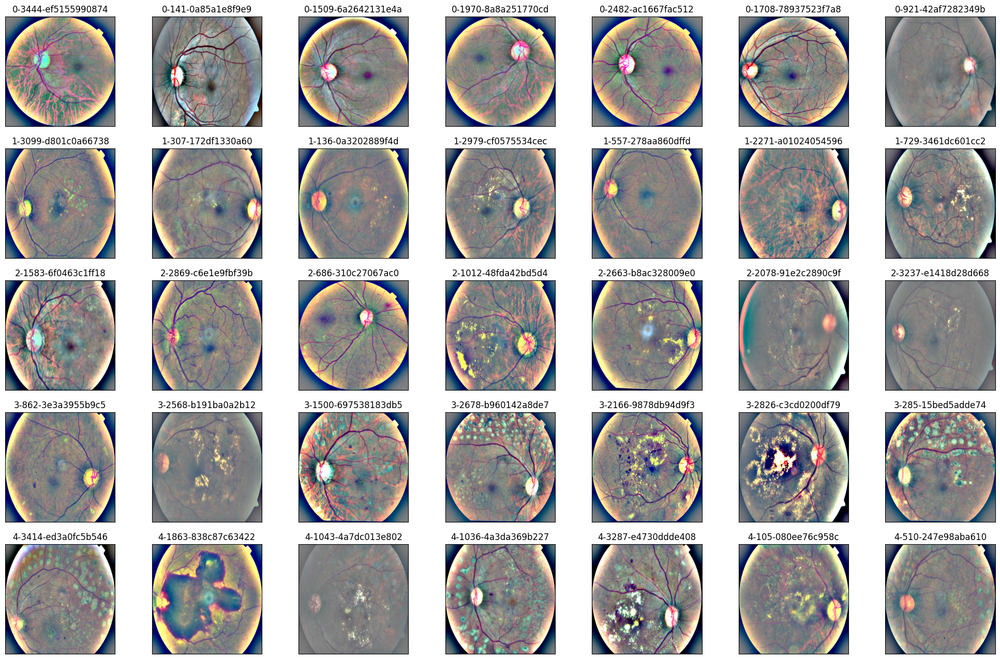

In [16]:
NUM_SAMP=7
fig = plt.figure(figsize=(25, 16))
for i in sorted(y_train.unique()):
    for j, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == i].sample(NUM_SAMP, random_state=42).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, i* NUM_SAMP + j + 1, xticks=[], yticks=[])
        path=f"input\\train_images/{row['id_code']}.png"
        image = load_ben_color(path,sigmaX=30)

        plt.imshow(image)
        ax.set_title('%d-%d-%s' % (i, idx, row['id_code']) )

In [17]:
def load_ben_color2(path, sigmaX=10):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image = crop_image_from_gray(image)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
  
        
    return image

Testing for same image using both method of color

512 512
512 512


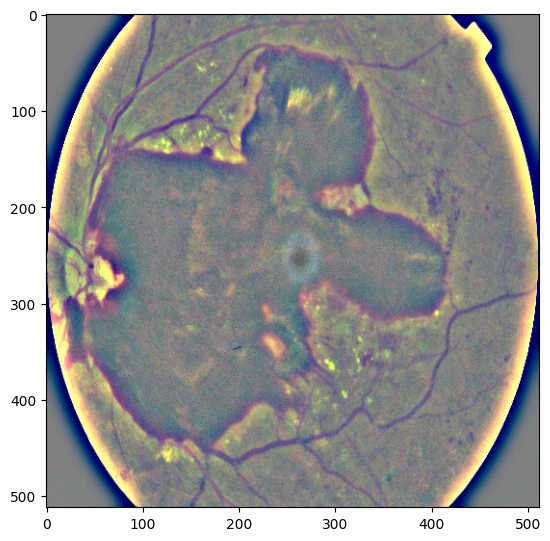

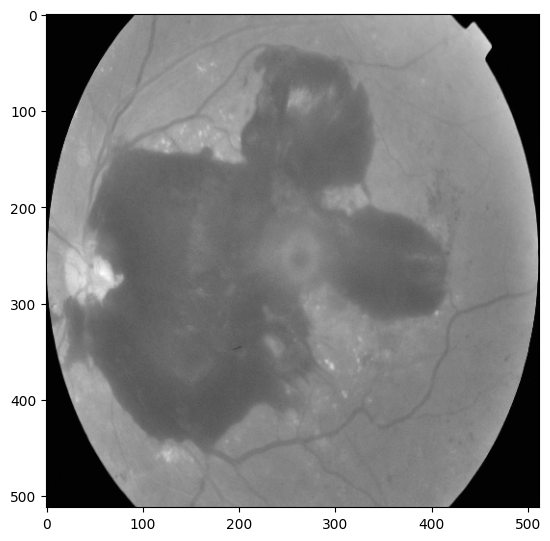

In [18]:
dpi = 80 #inch

path=f"input/train_images/838c87c63422.png" 
image = load_ben_color(path,sigmaX=10)

height, width = IMG_SIZE, IMG_SIZE
print(height, width)

SCALE=1
figsize = (width / float(dpi))/SCALE, (height / float(dpi))/SCALE

fig = plt.figure(figsize=figsize)
plt.imshow(image, cmap='gray')

dpi = 80 #inch

path=f"input/train_images/838c87c63422.png" 
image = load_ben_color2(path,sigmaX=10)

height, width = IMG_SIZE, IMG_SIZE
print(height, width)

SCALE=1
figsize = (width / float(dpi))/SCALE, (height / float(dpi))/SCALE

fig = plt.figure(figsize=figsize)
plt.imshow(image, cmap='gray')


512 512
512 512


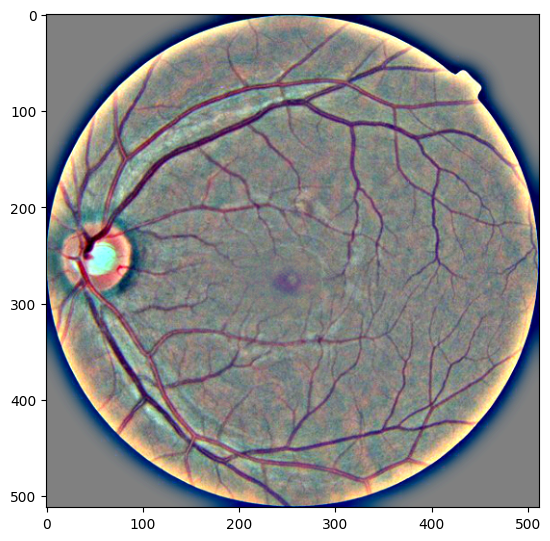

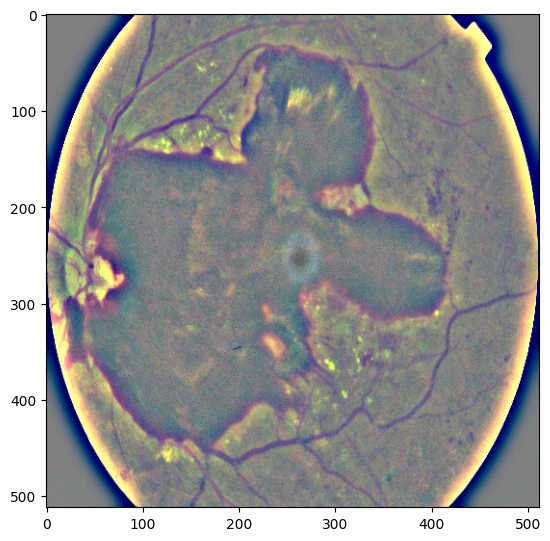

In [19]:
dpi = 80 #inch

path=f"input\\train_images/78937523f7a8.png" 
image = load_ben_color(path,sigmaX=10)

height, width = IMG_SIZE, IMG_SIZE
print(height, width)

SCALE=1
figsize = (width / float(dpi))/SCALE, (height / float(dpi))/SCALE

fig = plt.figure(figsize=figsize)
plt.imshow(image, cmap='gray')
dpi = 80 #inch


path=f"input/train_images/838c87c63422.png" 
image = load_ben_color(path,sigmaX=10)

height, width = IMG_SIZE, IMG_SIZE
print(height, width)

SCALE=1
figsize = (width / float(dpi))/SCALE, (height / float(dpi))/SCALE

fig = plt.figure(figsize=figsize)
plt.imshow(image, cmap='gray')


Use of logistics regression to create model and improve accuracy of project

In [20]:
train=pd.read_csv("input/train.csv")

In [21]:
train.head()

,id_code,diagnosis
0,000c1434d8d7,2
1,001639a390f0,4
2,0024cdab0c1e,1
3,002c21358ce6,0
4,005b95c28852,0


In [22]:
patient = train[train["diagnosis"]==4]
healt = train[train["diagnosis"] == 0]
train_df=pd.concat([patient,healt])

In [23]:
train_df["diagnosis"]=[1 if i==4 else 0 for i in train_df.diagnosis]

In [24]:
train_df.shape

(2100, 2)

In [25]:
x=train_df.drop(columns=["diagnosis"])
y=train_df.diagnosis

In [26]:
from sklearn.model_selection import train_test_split
x_train,x_test, y_train,y_test = train_test_split(x,y,test_size=0.30,random_state=42)


In [27]:
dn_x = [ Image.open('input/train_images/'+i+'.png') for i in x_train.id_code[:5]]

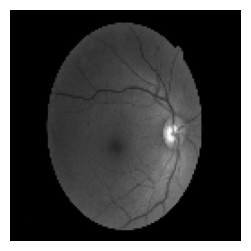

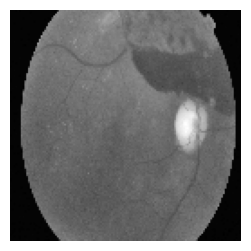

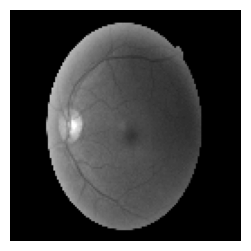

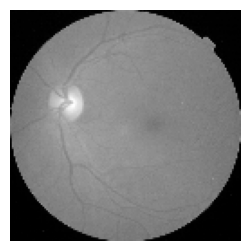

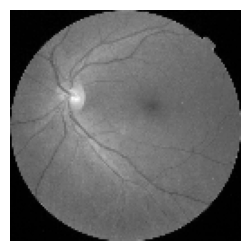

In [28]:
for i in dn_x:
    plt.figure(figsize=(5,3))
    i = cv2.resize(np.asarray(i),(64,64))
    i = cv2.cvtColor(i,cv2.COLOR_BGR2GRAY)
    plt.imshow(i,cmap="gray")
    plt.axis("off")
    plt.show

In [29]:
x_test = [cv2.resize(np.asarray(Image.open('input/train_images/'+i+'.png').convert("L")),(64,64)) for i in x_test.id_code]

In [30]:
x_train = [cv2.resize(np.asarray(Image.open('input/train_images/'+i+'.png').convert("L")),(64,64)) for i in x_train.id_code]

In [31]:
x_test=np.array(x_test)
x_test.shape

(630, 64, 64)

In [32]:
x_train=np.array(x_train)
x_train.shape

(1470, 128, 128)

In [33]:
x_train_flatten=x_train.reshape(x_train.shape[0],x_train.shape[1]*x_train.shape[2])
x_test_flatten=x_test.reshape(x_test.shape[0],x_test.shape[1]*x_test.shape[2])

x_train=x_train_flatten.T
y_train=y_train.T
x_test=x_test_flatten.T
y_test=y_test.T
print("x_train: ",x_train.shape)
print("x_test: ",x_test.shape)
print("y_train: ",y_train.shape)
print("y_test: ",y_test.shape)

x_train:  (16384, 1470)
x_test:  (4096, 630)
y_train:  (1470,)
y_test:  (630,)


In [34]:
y_train=np.array(y_train)
y_test=np.array(y_test)

y_train=y_train.reshape(-1,1)
y_test=y_test.reshape(-1,1)
print("y_train: ",y_train.shape)
print("y_test: ",y_test.shape)

y_train:  (1470, 1)
y_test:  (630, 1)


Intiallizing Parameters

In [35]:
def initialize_weights_and_bias(dimension):
    w = np.full((dimension, 1),0.01)
    b=0.0 
    return w,b

Sigmoid Function 

In [36]:
def sigmoid(z):
    y_head=1 / (1+np.exp(-z))
    return y_head

Forward Propogation

In [37]:
def forward_propagation(w,b,x_train,y_train):
    z=np.dot(w.T,x_train)+b
    y_head = sigmoid(z)
    loss = -y_train*np.log(y_head)-(1-y_train)*np.log(1-y_head)
    cost = (np.sum(loss)) / x_train.shape[1]
    return cost

Optimization Algorithm with Gradient Descent

In [38]:
def forward_backward_propagation(w,b,x_train,y_train):
    # forward propagation
    z=np.dot(w.T,x_train)+b
    y_head=sigmoid(z)
    loss=-y_train*np.log(y_head)-(1-y_train)*np.log(1-y_head)
    cost=(np.sum(loss))/x_train.shape[1]
    #backward propagation
    derivative_weight = (np.dot(x_train,((y_head-y_train).T)))/x_train.shape[1]
    derivative_bias=np.sum(y_head-y_train)/x_train.shape[1]
    gradients={"derivative_weight":derivative_weight,"derivative_bias":derivative_bias}
    return cost,gradients
    

In [39]:
#updating learning parameters
def update(w,b,x_train,y_train,learning_rate,number_of_iteration):
    cost_list = []
    cost_list2 = []
    index = []
    for i in range(number_of_iteration):
        cost,gradients=forward_backward_propagation(w,b,x_train,y_train)
        cost_list.append(cost)
        w=w-learning_rate*gradients["derivative_weight"]
        b=b-learning_rate*gradients["derivative_bias"]
        parameters = {"weight":w, "bias":b}
        return parameters,gradients, cost_list

In [40]:
#prediction
def predict(w,b,x_test):
    z=sigmoid(np.dot(w.T,x_test)+b)
    Y_prediction=np.zeros((1,x_test.shape[1]))
    for i in range(z.shape[1]):
        if z[0,i]<=0.5:
            Y_prediction[0,i]=0
        else:
            Y_prediction[0,i]=1
    return Y_prediction

In [41]:
# Logistic regression initialize
def logistic_regression(x_train,y_train,x_test,y_test,learning_rate,num_iterations):
    dimension=x_train.shape[0]
    w,b=initialize_weights_and_bias(dimension)
    parameters,gradients,cost_list=update(w,b,x_train,y_train,learning_rate,num_iterations)
    y_prediction_test=predict(parameters["weight"],parameters["bias"],x_test)
    y_prediction_train=predict(parameters["weight"],parameters["bias"],x_train)
    print("train accuracy: {} %".format(100 - np.mean(np.abs(y_prediction_train - y_train)) * 100))
    print("test accuracy: {} %".format(100 - np.mean(np.abs(y_prediction_test - y_test)) * 100))
logistic_regression(x_train, y_train, x_test, y_test,learning_rate = 0.01, num_iterations = 50)

ValueError: shapes (1470,16384) and (4096,630) not aligned: 16384 (dim 1) != 4096 (dim 0)

Testing Model accurary

In [ ]:
from sklearn import linear_model
logreg = linear_model.LogisticRegression(random_state=42,max_iter = 150)
print("test accuracy: {}".format(logreg.fit(x_train.T,y_train).score(x_test.T, y_test)))